# HOMEWORK PART 4

---

## Download the data set BZ.mat (which is a snipet from a Belousov-Zhabotinsky chemical oscillator movie – check them out on youtube).
1. get the data: download from the course website (It is next to HW 2)
2. See what you can do with the data (i.e. repeat the first two steps above)

This is an exploratory homework. So play around with the data and make sure to make lots of plots. Good luck, and have fun.

In [1]:
%matplotlib notebook
import numpy as np
from scipy.integrate import odeint
from scipy.io import loadmat
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rcParams, cm, rc
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LinearSegmentedColormap
import os
import h5py


rc('font',**{'family':'serif','serif':['Palatino']}) # Palatino font
plt.rcParams['pdf.fonttype'] = 42

In [2]:
def DMD(X, dX, r, time):
    """Apply Dynamic Mode Decomposition (DMD)
    
        Parameters
    ----------
    X : array
        State matrix size: features x time.
    dX : array
        Time shifted state matrix.
    time : array
        Time steps.
    r : int
        Rank truncation.

    Returns
    -------
    U, V, S : array
        Singular Value Decomposition (SVD) of X.
    x_dmd : array
        DMD reconstruction.
    
    """
    dt = time[1] - time[0]
    
    # SVD on the state matrix
    U, S, Vh = np.linalg.svd(X, full_matrices=False)
    V = Vh.conj().T
    U = U[:, :r]
    V = V[:, :r]
    S = S[:r]
    
    # Projection of state matrix onto U
    A_tilde = U.conj().T @ dX @ V @ np.linalg.inv(np.diag(S))
    
    # Eigenvalues
    Lambda, W = np.linalg.eig(A_tilde)
    
    # Eigenvectors
    Phi = dX @ V @ np.linalg.inv(np.diag(S)) @ W
    
    
    X0 = X[:, 0] # initial conditions

    omega = np.log(Lambda) / dt

    b = np.linalg.pinv(Phi) @ X0


    # Reconstruction
    x_dmd = np.zeros((r, len(time)), dtype=omega.dtype)
    for k in range(len(time)):
        x_dmd[:, k] = b * np.exp(omega * time[k])
    x_dmd = np.dot(Phi, x_dmd)
    
    #x_k = np.zeros((r, len(t_new)), dtype=omega.dtype)
    #for k in range(len(t_new)):
    #    x_k[:, k] = Phi @ (np.diag(Lambda) ** (k)) @ b
    
    return U, S, V, x_dmd   

In [3]:
if not os.path.exists('codes/BZ.mat'):
    !wget -P 'codes/' http://courses.washington.edu/amath582/BZ.mat

Define cmap

In [4]:
colors = [(0, 0, 0), (0.5, 0.5, 0.5), (1, 1, 1), (0.2, 1, 0.2), (0.5, 1., 0.5)]
cmap_name = 'dark_green'
cm = LinearSegmentedColormap.from_list(
        cmap_name, colors, N=100)

In [5]:
BZ_mat = h5py.File('codes/BZ.mat', 'r')
_BZ = BZ_mat.get('BZ_tensor')
BZ = np.array(_BZ).T
print('- - - - -')
print('Data set info:')
print('- - - - -')
print("Point along y : {}".format(BZ.shape[0]))
print("Point along x : {}".format(BZ.shape[1]))
print("Time step : {}".format(BZ.shape[2]))
print('- - - - -')

- - - - -
Data set info:
- - - - -
Point along y : 351
Point along x : 451
Time step : 1200
- - - - -


In [6]:
colors = [(0, 0, 0), (0.5, 0.5, 0.5), (0.2, 1, 0.2), (0., .5, 0.)]
cmap_name = 'dark_green'
cm = LinearSegmentedColormap.from_list(
        cmap_name, colors, N=100)

<IPython.core.display.Javascript object>


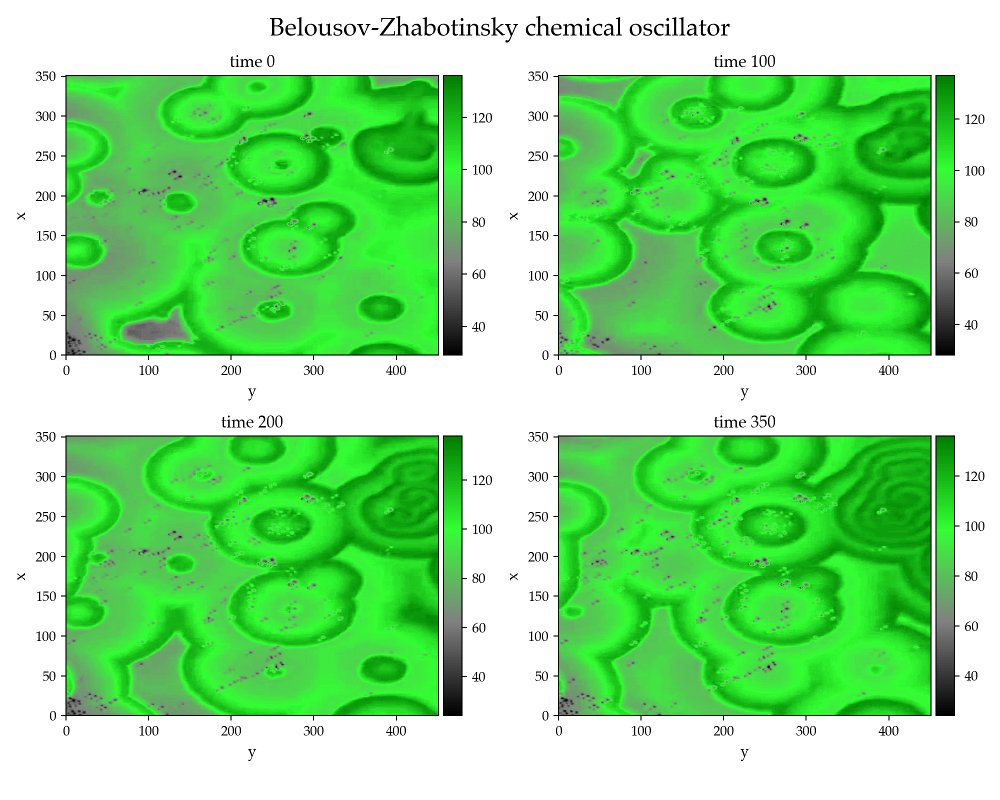

In [7]:
fig = plt.figure(figsize=(10, 8))
fig.suptitle('Belousov-Zhabotinsky chemical oscillator', fontsize=18)
gs = gridspec.GridSpec(2, 2)
gs.update(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.2, hspace=0.3) 
k = -1
j = 0

for _time in [0, 100, 200, 350]:

    if j % 2 == 0:
        k += 1
        
    ax = plt.subplot(gs[k, j%2])
    h = ax.imshow(BZ[:, :, _time].T, interpolation='lanczos', cmap=cm, 
                  extent=[0, 451, 0, 351], origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    ax.set_xlabel('y', fontsize = 11)
    ax.set_ylabel('x', fontsize = 11)
    ax.set_title('time %d' % _time, fontsize = 12)
    
    j += 1
    
gs.tight_layout(fig, rect=[0, 0.03, 1, 0.95])

fig.savefig('figures/BZ.pdf', format='pdf', dpi=1200)

In [8]:
x_dim = BZ.shape[0]
y_dim = BZ.shape[1]
t_dim = BZ.shape[2]
n_test_time = int(t_dim * 0.2)
v_flat = np.reshape(BZ, (x_dim * y_dim, t_dim))

X = np.copy(v_flat)

U, S, Vh = np.linalg.svd(X, full_matrices=False)
V = Vh.conj().T

<IPython.core.display.Javascript object>


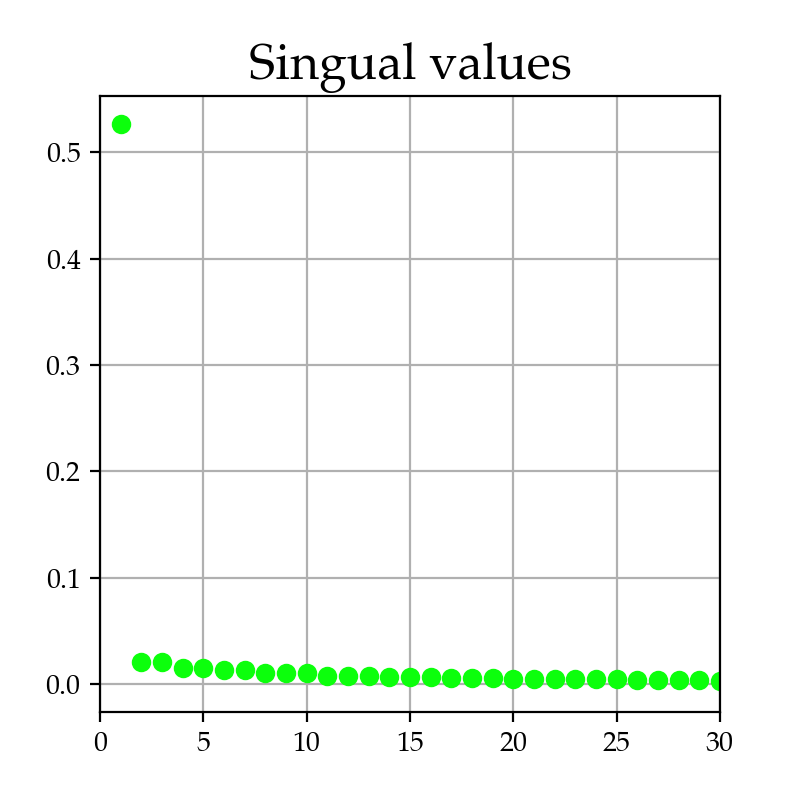

In [9]:
fig = plt.figure(figsize=(4, 4))
plt.plot(range(1,len(S)+1), S / np.sum(S), 'o', linewidth='2', color='xkcd:neon green')
plt.title('Singual values', fontsize = 18)
plt.xlim([0, 30])
plt.grid()

In [10]:
# train data
X_train = X[:, :-n_test_time]
dX_train = X[:, 1:-n_test_time+1]
# test data
X_test = X[:, -n_test_time:-1]
dX_test = X[:,-n_test_time+1:]

In [11]:
time = np.arange(0, t_dim)
r = 10
U, S, V, _x_dmd  = DMD(X_train, dX_train, r, time)

In [12]:
reconstruction = np.reshape(_x_dmd, (x_dim, y_dim, t_dim))
U_resh = np.reshape(U, (x_dim, y_dim, -1))

<IPython.core.display.Javascript object>


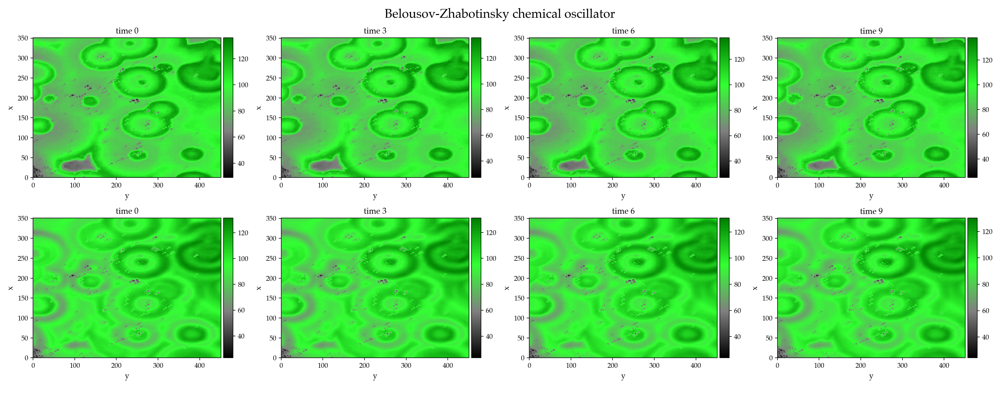

In [13]:
fig = plt.figure(figsize=(20, 8))
fig.suptitle('Belousov-Zhabotinsky chemical oscillator', fontsize=18)
gs = gridspec.GridSpec(2, 4)
gs.update(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.2, hspace=0.3) 
j = 0

for _time in [0, 3, 6, 9]:
        
    ax = plt.subplot(gs[0, j])
    h = ax.imshow(BZ[:, :, _time].T, interpolation='lanczos', cmap=cm, 
                  extent=[0, 451, 0, 351], origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    ax.set_xlabel('y', fontsize = 11)
    ax.set_ylabel('x', fontsize = 11)
    ax.set_title('time %d' % _time, fontsize = 12)
    
    ax = plt.subplot(gs[1, j])
    h = ax.imshow(np.real(reconstruction[:, :, _time].T), interpolation='lanczos', cmap=cm, 
                  extent=[0, 451, 0, 351], origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    ax.set_xlabel('y', fontsize = 11)
    ax.set_ylabel('x', fontsize = 11)
    ax.set_title('time %d' % _time, fontsize = 12)
    
    j += 1
    
gs.tight_layout(fig, rect=[0, 0.03, 1, 0.95])

fig.savefig('figures/BZ_closetime.pdf', format='pdf', dpi=1200)

<IPython.core.display.Javascript object>


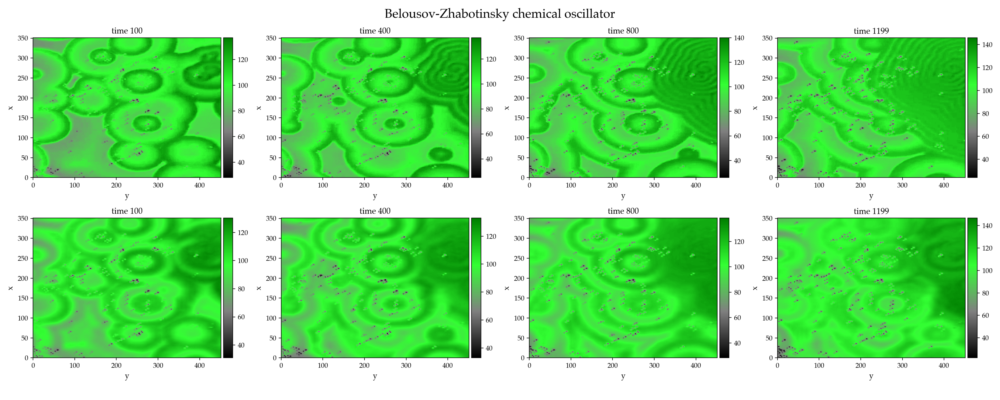

In [14]:
fig = plt.figure(figsize=(20, 8))
fig.suptitle('Belousov-Zhabotinsky chemical oscillator', fontsize=18)
gs = gridspec.GridSpec(2, 4)
gs.update(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.2, hspace=0.3) 
j = 0

for _time in [100, 400, 800, 1199]:
        
    ax = plt.subplot(gs[0, j])
    h = ax.imshow(BZ[:, :, _time].T, interpolation='lanczos', cmap=cm, 
                  extent=[0, 451, 0, 351], origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    ax.set_xlabel('y', fontsize = 11)
    ax.set_ylabel('x', fontsize = 11)
    ax.set_title('time %d' % _time, fontsize = 12)
    
    ax = plt.subplot(gs[1, j])
    h = ax.imshow(np.real(reconstruction[:, :, _time].T), interpolation='lanczos', cmap=cm, 
                  extent=[0, 451, 0, 351], origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    ax.set_xlabel('y', fontsize = 11)
    ax.set_ylabel('x', fontsize = 11)
    ax.set_title('time %d' % _time, fontsize = 12)
    
    j += 1
    
gs.tight_layout(fig, rect=[0, 0.03, 1, 0.95])

fig.savefig('figures/BZ_fartime.pdf', format='pdf', dpi=1200)

<IPython.core.display.Javascript object>


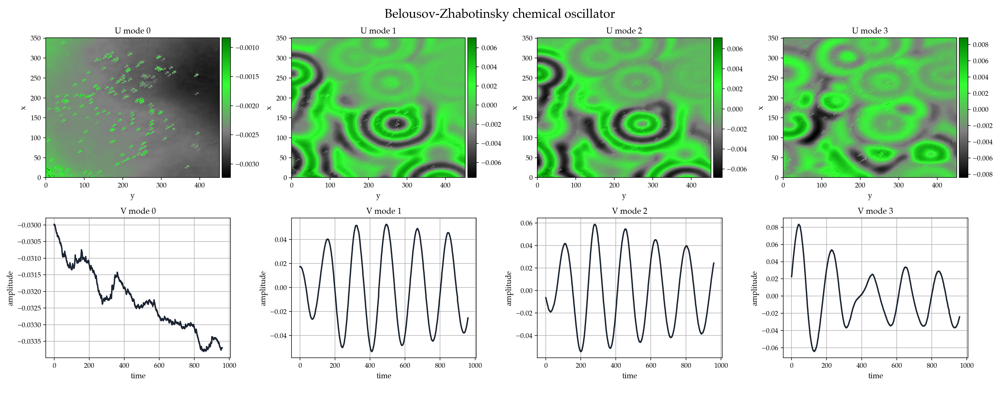

In [17]:
fig = plt.figure(figsize=(20, 8))
fig.suptitle('Belousov-Zhabotinsky chemical oscillator', fontsize=18)
gs = gridspec.GridSpec(2, 4)
gs.update(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.2, hspace=0.3) 

for j in [0, 1, 2, 3]:
        
    ax = plt.subplot(gs[0, j])
    h = ax.imshow(U_resh[:, :, j].T, interpolation='lanczos', cmap=cm, 
                  extent=[0, 451, 0, 351], origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    ax.set_xlabel('y', fontsize = 11)
    ax.set_ylabel('x', fontsize = 11)
    ax.set_title('U mode %d' % j, fontsize = 12)
    
    ax = plt.subplot(gs[1, j])
    h = ax.plot(V[:, j], linewidth='2', color='xkcd:dark')
    divider = make_axes_locatable(ax)
    ax.set_xlabel('time', fontsize = 11)
    ax.set_ylabel('amplitude', fontsize = 11)
    ax.set_title('V mode %d' % j, fontsize = 12)
    plt.grid(True, which="both")
    
gs.tight_layout(fig, rect=[0, 0.03, 1, 0.95])

fig.savefig('figures/BZ_firstmodes.pdf', format='pdf', dpi=1200)

<IPython.core.display.Javascript object>


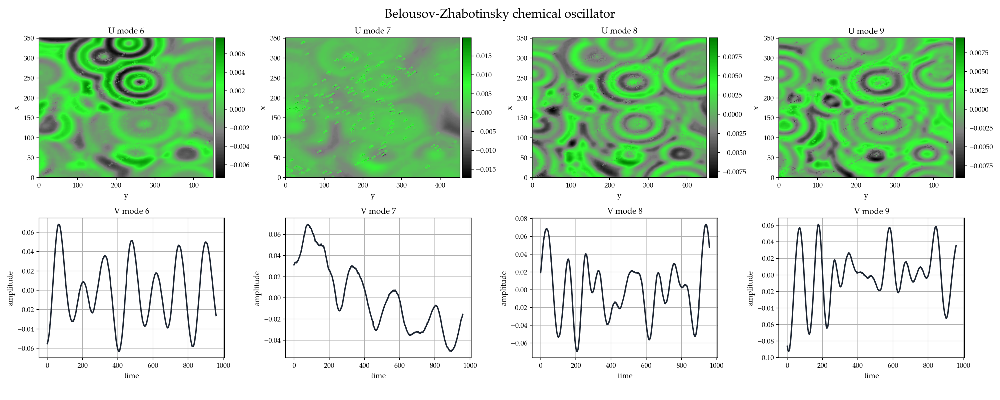

In [16]:
fig = plt.figure(figsize=(20, 8))
fig.suptitle('Belousov-Zhabotinsky chemical oscillator', fontsize=18)
gs = gridspec.GridSpec(2, 4)
gs.update(top=0.9, bottom=0.1, left=0.1, right=0.9, wspace=0.2, hspace=0.3) 
i = 0

for j in [6, 7, 8, 9]:
        
    ax = plt.subplot(gs[0, i])
    h = ax.imshow(U_resh[:, :, j].T, interpolation='lanczos', cmap=cm, 
                  extent=[0, 451, 0, 351], origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    ax.set_xlabel('y', fontsize = 11)
    ax.set_ylabel('x', fontsize = 11)
    ax.set_title('U mode %d' % j, fontsize = 12)
    
    ax = plt.subplot(gs[1, i])
    h = ax.plot(V[:, j], linewidth='2', color='xkcd:dark')
    divider = make_axes_locatable(ax)
    ax.set_xlabel('time', fontsize = 11)
    ax.set_ylabel('amplitude', fontsize = 11)
    ax.set_title('V mode %d' % j, fontsize = 12)
    plt.grid(True, which="both")
    i+= 1
    
gs.tight_layout(fig, rect=[0, 0.03, 1, 0.95])

fig.savefig('figures/BZ_lastmodes.pdf', format='pdf', dpi=1200)